## 1. Initial Setup and Library Imports

This section installs necessary libraries and imports all modules required for building and running the traffic simulation and analysis. This includes `osmnx` for network handling, `networkx` for graph operations, `matplotlib` for plotting, `random` for car path generation, `dataclasses` for structured data, `numpy` for numerical operations, and `scipy.stats` for statistical analysis.

In [ ]:
!pip install osmnx

In [ ]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import random
from dataclasses import dataclass
from typing import List, Tuple, Dict, Set, Optional
EdgeKey = Tuple[int, int, int]  # (u, v, key) for multi-graphs
from collections import defaultdict
import numpy as np
from scipy.stats import pearsonr
from matplotlib.gridspec import GridSpec
import matplotlib.colors as mcolors


---

## 2. Core Simulation Components

This section defines the three foundational classes that power the traffic simulation:

1. **`NetworkLoader`**: Downloads and preprocesses road networks from OpenStreetMap
2. **`Car`**: Represents individual vehicle state (route, position, speed)
3. **`TrafficSimulation`**: Main simulation engine with density-dependent dynamics

---

### 2.1 NetworkLoader: Road Network Acquisition and Preprocessing

The `NetworkLoader` class handles all geographic data operations:

**Key Responsibilities:**
- **Download:** Fetch drivable road networks from OpenStreetMap API
- **Enrich:** Add speed limits and travel-time attributes to all edges
- **Validate:** Extract largest strongly connected component (ensures all OD pairs are reachable)
- **Utilities:** Provide plotting, statistics, and geocoding helpers

**Why Strongly Connected Components?**  
Raw OSM data often contains disconnected fragments (parking lots, dead-end service roads). By keeping only the largest SCC, we guarantee that any randomly selected origin-destination pair has a valid connecting path, preventing `NetworkXNoPath` exceptions during shortest-path computation.

**Factory Pattern:**  
The `from_address()` class method enables text-based network loading:
```python
loader = NetworkLoader.from_address("Times Square, NYC", dist=1000)

In [ ]:
class NetworkLoader:
    """
    Loads and manages road network data from OpenStreetMap.

    Provides methods to fetch drivable road networks for any geographic location,
    add required attributes for traffic simulation, and visualize the network.

    Attributes:
        lat (float): Latitude of network center point
        lon (float): Longitude of network center point
        dist (int): Distance in meters to fetch roads around the center point
        network_type (str): Type of road network ('drive', 'walk', 'bike', etc.)
        G (nx.MultiDiGraph): The loaded and processed road network graph
    """

    def __init__(self, lat: float, lon: float, dist: int = 1000,
                 network_type: str = "drive"):
        """
        Initialize network loader with location parameters.

        Args:
            lat (float): Latitude of center point
            lon (float): Longitude of center point
            dist (int): Radius in meters to fetch roads (default: 1000)
            network_type (str): Type of network to fetch (default: "drive")
                Options: 'drive', 'drive_service', 'walk', 'bike', 'all'

        Example:
            # Buenos Aires residence hall
            loader_ba = NetworkLoader(lat=-34.59748, lon=-58.37879, dist=1000)

            # Obelisco area
            loader_ob = NetworkLoader(lat=-34.6037, lon=-58.3816, dist=1500)
        """
        self.lat = lat
        self.lon = lon
        self.dist = dist
        self.network_type = network_type
        self.G = None  # Will be populated by load()

    def load(self) -> nx.MultiDiGraph:
        """
        Fetch and process the road network from OpenStreetMap.

        Downloads the road network, adds speed and travel time attributes,
        and extracts the largest strongly connected component to ensure
        all routes are valid.

        Returns:
            nx.MultiDiGraph: Processed road network with attributes:
                - 'speed_kph': Speed limit in km/h
                - 'travel_time': Expected travel time in seconds
                - 'length': Edge length in meters
                - 'lanes': Number of lanes (when available)

        Side effects:
            Sets self.G to the loaded network
        """
        print(f"Fetching road network at ({self.lat:.4f}, {self.lon:.4f})...")

        # Fetch network from OSM
        G = ox.graph_from_point(
            (self.lat, self.lon),
            dist=self.dist,
            network_type=self.network_type
        )

        print(f"Downloaded {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

        # Add speed and travel time attributes
        G = ox.add_edge_speeds(G)
        G = ox.add_edge_travel_times(G)

        # Extract largest strongly connected component
        largest_scc_nodes = max(nx.strongly_connected_components(G), key=len)
        G_scc = G.subgraph(largest_scc_nodes).copy()

        print(f"After SCC extraction: {G_scc.number_of_nodes()} nodes, "
              f"{G_scc.number_of_edges()} edges")

        self.G = G_scc
        return self.G

    def plot(self, figsize: Tuple[int, int] = (10, 10),
             node_size: int = 0, edge_color: str = '#888888',
             bgcolor: str = 'white'):
        """
        Visualize the road network.

        Args:
            figsize (tuple): Figure size (width, height) in inches
            node_size (int): Size of node markers (0 to hide nodes)
            edge_color (str): Color for road edges
            bgcolor (str): Background color

        Returns:
            tuple: (fig, ax) matplotlib figure and axes objects

        Raises:
            ValueError: If network hasn't been loaded yet (call load() first)
        """
        if self.G is None:
            raise ValueError("Network not loaded. Call load() first.")

        fig, ax = ox.plot_graph(
            self.G,
            figsize=figsize,
            node_size=node_size,
            edge_color=edge_color,
            bgcolor=bgcolor,
            show=False,
            close=False
        )

        ax.set_title(f"Road Network at ({self.lat:.4f}, {self.lon:.4f})",
                     fontsize=12, pad=10)

        return fig, ax

    def get_min_travel_time(self) -> float:
        """
        Get the minimum travel time of any edge in the network.

        Returns:
            float: Minimum travel time in seconds

        Raises:
            ValueError: If network hasn't been loaded yet
        """
        if self.G is None:
            raise ValueError("Network not loaded. Call load() first.")

        return min(data['travel_time']
                for u, v, k, data in self.G.edges(keys=True, data=True))

    def get_network_stats(self) -> dict:
        """
        Get summary statistics about the road network.

        Returns:
            dict: Network statistics including nodes, edges, min/max/avg travel times

        Raises:
            ValueError: If network hasn't been loaded yet
        """
        if self.G is None:
            raise ValueError("Network not loaded. Call load() first.")

        travel_times = [data['travel_time']
                       for u, v, k, data in self.G.edges(keys=True, data=True)]

        return {
            'num_nodes': self.G.number_of_nodes(),
            'num_edges': self.G.number_of_edges(),
            'min_travel_time': min(travel_times),
            'max_travel_time': max(travel_times),
            'avg_travel_time': sum(travel_times) / len(travel_times)
        }
    @classmethod
    def from_address(cls, address: str, dist: int = 1000,
                     network_type: str = "drive"):
        """
        Create a NetworkLoader from a text address instead of coordinates.

        Args:
            address (str): Address or place name to geocode
            dist (int): Radius in meters (default: 1000)
            network_type (str): Type of network (default: "drive")

        Returns:
            NetworkLoader: Initialized loader at the geocoded location

        Example:
            loader = NetworkLoader.from_address(
                "Obelisco, Buenos Aires, Argentina",
                dist=1500
            )
            loader.load()
        """
        # Geocode the address to get lat/lon
        location = ox.geocode(address)
        return cls(lat=location[0], lon=location[1], dist=dist,
                   network_type=network_type)

    def __repr__(self):
        status = f"{self.G.number_of_nodes()} nodes" if self.G else "not loaded"
        return (f"NetworkLoader(lat={self.lat:.4f}, lon={self.lon:.4f}, "
                f"dist={self.dist}m, {status})")

### 2.2 Car: Per-Vehicle State Representation

Each `Car` object encapsulates the complete state of a single vehicle moving through the network.

**State Variables:**
- `path_nodes`: Route as a sequence of intersection IDs (e.g., `[A, B, C, D]`)
- `edges`: Route as edge keys `[(u, v, k), ...]` for multigraph compatibility
- `edge_idx`: Current position in the edges list (which road segment the car is on)
- `pos_m`: Continuous position along current edge in meters (enables sub-edge granularity)
- `speed_ms`: Instantaneous velocity in m/s (updated each time step based on density)
- `done`: Boolean flag indicating journey completion

**Why Dual Path Representation?**  
NetworkX's `shortest_path()` returns node sequences, but MultiDiGraphs can have multiple parallel edges between nodes (e.g., highway + service road). The `edges` list stores the specific edge keys selected for each node transition, ensuring deterministic routing.

**Continuous Position Tracking:**  
Unlike discrete models that "hop" between intersections, this implementation tracks meter-level position (`pos_m`). This enables:
- Realistic gradual movement along long road segments
- Accurate density calculations (cars distributed along edges, not bunched at nodes)
- Proper spillback mechanics (cars can wait at edge endpoints when downstream is jammed)

In [ ]:
@dataclass
class Car:
    """
    Represents a vehicle moving through the road network.

    A car follows a predetermined path from origin to destination, moving along
    edges at velocities determined by traffic density (congestion).

    Attributes:
        path_nodes (List[int]): Sequence of node IDs representing the route
        edges (List[EdgeKey]): Sequence of edge tuples (u, v, k) to traverse
        edge_idx (int): Current position in the edges list (default: 0)
        pos_m (float): Position along current edge in meters (default: 0.0)
        speed_ms (float): Current speed in meters per second (default: 0.0)
        done (bool): Whether car has completed its journey (default: False)
    """
    path_nodes: List[int]
    edges: List[EdgeKey]
    edge_idx: int = 0
    pos_m: float = 0.0
    speed_ms: float = 0.0
    done: bool = False

    def current_edge(self) -> Optional[EdgeKey]:
        """
        Get the edge the car is currently traversing.

        Returns:
            Optional[EdgeKey]: Current edge tuple (u, v, k) or None if journey complete
        """
        if self.done or self.edge_idx >= len(self.edges):
            return None
        return self.edges[self.edge_idx]

### 2.3 TrafficSimulation: Link-Based Dynamics Engine

The core simulation class implements a **Greenshields-style density-velocity relationship** where traffic speed decreases linearly with vehicle density:

$$v_{\text{eff}}(n) = v_{\text{max}} \left(1 - \frac{\rho}{\rho_{\text{jam}}}\right) \quad \text{where} \quad \rho = \frac{n}{\text{length}_{\text{km}} \times \text{lanes}}$$

**Key Features:**

1. **Adaptive Time Stepping:**  
   If no `step_size` is provided, the simulator auto-sets $\Delta t$ to the minimum edge travel time, preventing cars from overshooting short alleys while maintaining efficiency on long avenues.

2. **Spillback Prevention:**  
   Before moving to the next edge, cars check downstream capacity. If the next edge is jammed ($v_{\text{eff}} = v_{\text{min}}$), the car waits at the current edge's endpoint rather than forcing entry.

3. **Continuous Respawning:**  
   When a car completes its trip (`done = True`), it's immediately replaced with a new random OD pair, maintaining constant vehicle population and steady-state demand.

4. **Congestion Metric:**  
   Normalized congestion $c \in [0, 1]$ rescales velocity reduction relative to the minimum speed:
   $$c = \frac{v_{\text{free}} - v_{\text{eff}}}{v_{\text{free}} - v_{\text{min}}}$$
   - $c = 0$: Free-flow conditions (no congestion)
   - $c = 1$: Gridlock (minimum enforced speed)

5. **Visualization:**  
   The `draw()` method uses a perceptually-enhanced colormap (sqrt transform + RdYlGn_r) on a dark background for publication-quality congestion heatmaps.


In [ ]:
class TrafficSimulation:
    """
    Link-based traffic simulation using density-dependent velocity model.

    Simulates vehicle movement on a road network where car speeds are reduced
    by congestion according to a Greenshields-like traffic flow model. Cars follow
    shortest paths and their velocities decrease as edge density increases.

    Attributes:
        num_cars (int): Number of vehicles to simulate
        step_size (float): Time step duration in seconds for simulation updates
        seed (int): Random seed for reproducibility of car routes
        g (nx.MultiDiGraph): Road network graph (set during initialize())
        cars (List[Car]): List of car objects (set during initialize())
        on_road_cars (dict): Mapping from edge keys to sets of car IDs on each edge
    """
    def __init__(self,
                 num_cars: int,
                 step_size: float=None,
                 seed: int=0,
                 network_loader=None,
                 jam_density_vpkpl=120,
                 minimum_speed=1
        ):
        """
        Initialize traffic simulation parameters.

        Args:
            num_cars (int): Number of cars to simulate
            step_size (float): Simulation time step in seconds (default: 0.1)
            seed (int): Random seed for route generation (default: 0)
            network_loader (NetworkLoader, optional): NetworkLoader instance.
            If None, uses Buenos Aires default location.
        """
        self.num_cars: int = num_cars
        self.step_size: Optional[float] = step_size
        self.seed: int = seed
        self.network_loader = network_loader
        self.jam_density_vpkpl = jam_density_vpkpl # cars per kilometer per lane at jam
        self.minimum_speed = minimum_speed
        random.seed(self.seed)

    def initialize(self):
        """
        Initialize the simulation by loading the network and creating cars.

        Loads the road network, generates random origin-destination pairs for each car,
        and computes shortest paths based on travel time. Cars that cannot find a valid
        path are regenerated until all cars have valid routes.

        Side effects:
            - Sets self.g to the road network graph
            - Populates self.cars with Car objects on valid routes
            - Initializes self.on_road_cars as empty (cars start moving at first step)
        """
        # Load network
        if self.network_loader is None:
            # Default: Buenos Aires
            self.network_loader = NetworkLoader(
                lat=-34.59748529008161,
                lon=-58.37879517707388,
                dist=1000
            )
            self.network_loader.load()
        elif self.network_loader.G is None:
            # User passed a NetworkLoader but didn't call load()
            self.network_loader.load()

        self.g: nx.MultiDiGraph = self.network_loader.G
        self.cars: List[Car] = []
        self.on_road_cars: dict[EdgeKey, Set[int]] = {}

        # If step_size not given assign it to minimum travel time edge in graph
        if self.step_size is None:
            self.step_size = min(data['travel_time'] for u, v, k, data in self.g.edges(keys=True, data=True))
            print(f"Assigned step size based on minimum travel time edge to be {self.step_size}")

        nodes = list(self.g.nodes)
        for _ in range(self.num_cars):
            self.cars.append(self._spawn_car(nodes))


    def _spawn_car(self, nodes=None) -> Car:
        if nodes == None:
            nodes = list(self.g.nodes)
        while True:
            try:
                # Use sample to guarantees 2 different nodes
                start, end = random.sample(nodes, 2)
                path = nx.shortest_path(self.g, start, end, weight='travel_time')
                edges = self._nodes_to_edge_key(path)
                car = Car(path_nodes=path, edges=edges)
                return car
            except nx.NetworkXNoPath:
                continue


    def _nodes_to_edge_key(self, path_nodes: List[int]) -> Optional[EdgeKey]:
        """
        Convert a path of nodes to a sequence of edge keys.

        For multigraphs (where multiple edges can exist between two nodes),
        selects the edge with minimum travel time for each node pair.

        Args:
            path_nodes (List[int]): Sequence of node IDs representing a path

        Returns:
            List[EdgeKey]: Sequence of edge tuples (u, v, k) where k is the edge key
        """
        edges: List[EdgeKey] = []
        for u, v in zip(path_nodes[:-1], path_nodes[1:]):
            best_key = None
            best_travel_time = float('inf')

            # Enumerate the edges between the pair of nodes and pick the shortest
            for key, data in self.g[u][v].items():
                if data['travel_time'] < best_travel_time:
                    best_travel_time = data['travel_time']
                    best_key = key

            if best_key is not None:
                edges.append((u, v, best_key))

        return edges

    def get_edge_congestion(self, edge: EdgeKey) -> float:
        """
        Calculate normalized congestion level for a specific edge.

        When minimum speed is enforced, congestion is rescaled so that:
          - 0.0 = free-flow speed (no congestion)
          - 1.0 = minimum speed (maximum practical congestion)

        Args:
            edge: Edge identifier tuple (u, v, k)

        Returns:
            Congestion metric in [0, 1] where:
            - 0.0 = no congestion (free-flow speed)
            - 1.0 = complete gridlock (zero speed)
        """
        u, v, k = edge
        data = self.g[u][v][k]

        # Get number of cars on this edge
        n = len(self.on_road_cars.get(edge, set()))

        # Calculate effective velocity based on current density
        v_eff = self._calculate_velocity(n, data)

        # Get free-flow velocity (speed limit)
        speed_kph = data['speed_kph']
        if isinstance(speed_kph, (list, tuple)):
            speed_kph = speed_kph[0]
        v_free = float(speed_kph) / 3.6  # Convert km/h to m/s

        # Compute congestion: higher values = more congested
        if v_free > self.minimum_speed:
            congestion = (v_free - v_eff) / (v_free - self.minimum_speed)
            return np.clip(congestion, 0.0, 1.0)  # Ensure [0, 1] range
        else:
            # Edge case: free-flow speed is at or below minimum
            return 0.0 if v_eff >= v_free else 1.0

    def step(self):
        """
        Advance the simulation by one time step.

        Updates all car positions and speeds based on current traffic density:
        1. Calculate effective velocity for each edge based on car count (density)
        2. Move each car along its current edge according to its velocity
        3. Transition cars to next edge when they complete current edge
        4. Mark cars as done when they reach their destination

        Side effects:
            - Updates car.pos_m, car.speed_ms, car.edge_idx, and car.done for all cars
            - Updates self.on_road_cars to reflect new car positions
        """
        edge_speed: Dict[EdgeKey, float] = {}

        for u, v, k, data in self.g.edges(keys=True, data=True):
            n = len(self.on_road_cars.get((u, v, k), set()))
            velocity = self._calculate_velocity(n, data)
            edge_speed[(u, v, k)] = velocity

        next_on_road_cars: Dict[EdgeKey, Set[int]] = {}
        for car_id in range(len(self.cars)):
            car = self.cars[car_id]
            if car.done:
                # Respawn new car
                car = self._spawn_car()
                self.cars[car_id] = car

            edge = car.current_edge()
            if edge is None:
                car.done = True
                continue

            velocity = edge_speed[edge]
            car.speed_ms = velocity
            car.pos_m += car.speed_ms * self.step_size

            u, v, k = edge
            edge_length = self.g[u][v][k]['length']
            if isinstance(edge_length, (list, tuple)):
                edge_length = edge_length[0]
            edge_length = float(edge_length)

            if car.pos_m < edge_length:
                next_on_road_cars.setdefault(edge, set()).add(car_id)
            else:
                # Car reached end of edge - check if next edge is jammed
                car.edge_idx += 1
                next_edge = car.current_edge()
                if next_edge is None:
                    car.done = True
                    car.pos_m = 0.0
                else:
                    # Check if next edge has capacity (spillback prevention)
                    u_next, v_next, k_next = next_edge
                    next_edge_data = self.g[u_next][v_next][k_next]
                    # Count cars already on next edge (from previous step) + cars moving there (current step)
                    prev_n = len(self.on_road_cars.get(next_edge, set()))
                    current_n = len(next_on_road_cars.get(next_edge, set()))
                    next_n = prev_n + current_n
                    next_velocity = self._calculate_velocity(next_n, next_edge_data)

                    if next_velocity == self.minimum_speed:
                        # Next edge is jammed - spillback: stay at end of current edge
                        car.edge_idx -= 1  # Revert to current edge
                        car.pos_m = edge_length  # Wait at end
                        next_on_road_cars.setdefault(edge, set()).add(car_id)
                    else:
                        # Next edge has capacity - proceed
                        car.pos_m -= edge_length
                        next_on_road_cars.setdefault(next_edge, set()).add(car_id)

        self.on_road_cars = next_on_road_cars

    def _calculate_velocity(self, n: int, data: dict) -> float:
        """
        Calculate effective vehicle velocity on an edge based on traffic density.

        Uses a Greenshields-like linear density-velocity relationship:
            v = v_max * (1 - density / jam_density)

        where density = cars / (length_km * lanes)

        Args:
            n (int): Number of cars currently on the edge
            data (dict): Edge attributes containing 'speed_kph', 'length', and optionally 'lanes'

        Returns:
            float: Effective velocity in meters per second (m/s)

        Notes:
            - Uses jam_density = 15 cars/km/lane (empirical traffic flow parameter)
            - Defaults to 1 lane if lane data unavailable
            - Returns free-flow speed (v_max) when density is zero
        """
        # Extract scalar values (handle sequences/arrays from OSMnx)
        speed_kph = data['speed_kph']
        if isinstance(speed_kph, (list, tuple)):
            speed_kph = speed_kph[0]
        speed_kph = float(speed_kph)

        length = data['length']
        if isinstance(length, (list, tuple)):
            length = length[0]
        length = float(length)

        v_max = speed_kph / 3.6  # Convert to m/s

        try:
            lanes = data.get('lanes', 1)
            if isinstance(lanes, (list, tuple)):
                lanes = int(lanes[0])
            else:
                lanes = int(lanes)
        except Exception:
            lanes = 1

        density = n / (length / 1000.0 * lanes)  # cars per kilometer per lane

        # Simple model: reduce speed by 10% for each 10% increase in density
        v_eff = v_max * (1 - density / self.jam_density_vpkpl)
        return max(self.minimum_speed, v_eff)

    def draw(self, title: Optional[str] = None):
        """Plot: color by congestion with variable edge widths

        Uses RdYlGn_r colormap (red=congested, yellow=medium, green=free) for better visibility.
        Edge widths are scaled by congestion level.

        Args:
            title (str, optional): Custom title for the plot. If None, generates title
                from network location.
        """
        # Calculate congestion for each edge (1 - v_eff / v_free)
        cong_values = []
        for edge in self.g.edges(keys=True):
            congestion = self.get_edge_congestion(edge)
            cong_values.append(congestion)

        # Plot: color by congestion with variable edge widths
        # Use RdYlGn_r (red=congested, yellow=medium, green=free) for better visibility
        cmap = plt.cm.RdYlGn_r

        # Stretch contrast: apply power to emphasize differences
        stretched_values = [c**0.5 for c in cong_values]  # sqrt makes low values more visible
        edge_colors = [cmap(v) for v in stretched_values]
        edge_widths = [1.0 + 4.0 * c for c in cong_values]  # Thicker lines

        fig, ax = ox.plot_graph(
            self.g,
            node_size=0,
            bgcolor="#2b2b2b",  # Dark background for better contrast
            edge_color=edge_colors,
            edge_linewidth=edge_widths,
            edge_alpha=0.95,
            figsize=(8, 8),
            show=False,
            close=False,
        )
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0.0, vmax=1.0))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
        cbar.set_label("time-averaged congestion = 1 − v_eff / v_free", color='white', fontsize=11)
        cbar.ax.tick_params(colors='white')

        # Generate title from network location if not provided
        if title is None:
            title = f"Road network at ({self.network_loader.lat:.4f}, {self.network_loader.lon:.4f}) — traffic simulation (density → speed)"

        ax.set_title(title, color='white', fontsize=13, pad=15)

        return fig, ax
    def analyze_congestion_evolution(self, num_steps: int = 1000, verbose: bool = True):
        """
        Run simulation and track congestion evolution over time.

        Returns:
            dict with keys:
                'time_steps', 'mean_congestion', 'std_congestion', 'statistics'
        """
        congestion_means, congestion_stds = [], []

        for _ in range(num_steps):
            self.step()

            # per-edge congestion snapshot this tick
            edge_congestions = [self.get_edge_congestion(edge)
                                for edge in self.g.edges(keys=True)]
            congestion_means.append(float(np.mean(edge_congestions)))
            congestion_stds.append(float(np.std(edge_congestions)))

        congestion_means = np.asarray(congestion_means, dtype=float)
        congestion_stds  = np.asarray(congestion_stds,  dtype=float)
        time_array       = np.arange(congestion_means.size)

        # windows (robust if num_steps < 100)
        win_init   = int(min(100, congestion_means.size))
        win_steady = int(min(100, congestion_means.size))

        statistics = {
            'initial_congestion'      : float(np.mean(congestion_means[:win_init])),
            'steady_state_congestion' : float(np.mean(congestion_means[-win_steady:])),
            'peak_congestion'         : float(np.max(congestion_means)),
            'peak_step'               : int(np.argmax(congestion_means)),
            'min_congestion'          : float(np.min(congestion_means)),
            'min_step'                : int(np.argmin(congestion_means)),
            'avg_congestion'          : float(np.mean(congestion_means)),
            'std_congestion'          : float(np.std(congestion_means)),
            'initial_window'          : win_init,
            'steady_window'           : win_steady,
        }

        if verbose:
            print("\n=== Congestion Statistics ===")
            print(f"Initial congestion (first {win_init} steps): {statistics['initial_congestion']:.3f}")
            print(f"Steady-state congestion (last  {win_steady} steps): {statistics['steady_state_congestion']:.3f}")
            print(f"Peak congestion: {statistics['peak_congestion']:.3f} at step {statistics['peak_step']}")
            print(f"Minimum congestion: {statistics['min_congestion']:.3f} at step {statistics['min_step']}")
            print(f"Average congestion: {statistics['avg_congestion']:.3f} ± {statistics['std_congestion']:.3f}")

        return {
            'time_steps'      : time_array,
            'mean_congestion' : congestion_means,
            'std_congestion'  : congestion_stds,
            'statistics'      : statistics,
        }


    def plot_congestion_evolution(self, evolution_data: dict, title: str = None,
                                  show_std: bool = False, figsize: tuple = (8, 6)):
        """
        Plot congestion evolution over time as a single mean line
        """
        import numpy as np
        import matplotlib.pyplot as plt

        fig, ax = plt.subplots(figsize=figsize)

        # unpack
        t   = np.asarray(evolution_data['time_steps'])
        mu  = np.asarray(evolution_data['mean_congestion'], dtype=float)
        # std present in data but not plotted (show_std is ignored unless True)

        # mean line only (blue)
        ax.plot(t, mu, color='#1f77b4', lw=2, label='Mean Congestion')


        ax.set_xlabel('Time Step', fontsize=11)
        ax.set_ylabel('Congestion Level', fontsize=11)

        if title is None:
            num_edges = self.g.number_of_edges()
            title = (f'Network Congestion Evolution - Obelisco, Buenos Aires\n'
                    f'({self.num_cars} cars, {num_edges} edges)')
        ax.set_title(title, fontsize=12)


        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='upper right', frameon=True, fontsize=9)

        plt.tight_layout()
        return fig, ax


---

## 3. Simulation Demonstrations

### 3.1 Animation Helper Function

This utility wraps the `TrafficSimulation` in a Matplotlib `FuncAnimation` loop for dynamic visualization.

**How It Works:**
1. Run the simulation for a burst of steps (default: 20 steps per frame)
2. Recompute congestion colors using the same styling as `draw()`
3. Update the plot while keeping axes/colorbar fixed
4. Return an HTML5-compatible animation object

**Performance Optimization:**  
Stepping 20 simulation ticks per frame reduces animation overhead while still capturing meaningful temporal dynamics. A 50-frame animation thus covers 1,000 simulation steps.

**Why Separate from `draw()`?**  
The `draw()` method creates a new static figure each call. This animation function reuses a persistent figure and only updates edge colors/widths, avoiding matplotlib memory leaks during long animations.

In [ ]:
def create_traffic_animation(num_cars=100, num_steps=50, step_size=None, seed=0, network_loader=None):
    """
    Create an animation of the traffic simulation using the sim.draw() method.

    Parameters:
    - num_cars: Number of cars in the simulation
    - num_steps: Number of simulation steps to animate
    - step_size: Size of each time step
    - seed: Random seed for reproducibility
    - network_loader: NetworkLoader instance (optional)

    Returns:
    - Animation object
    """
    from matplotlib import animation
    from matplotlib.pyplot import close

    # Initialize simulation
    sim = TrafficSimulation(num_cars=num_cars, step_size=step_size, seed=seed, network_loader=network_loader)
    sim.initialize()

    # Create initial figure using draw to get the layout
    initial_fig, initial_ax = sim.draw(title="Initializing...")

    # Store bounds and close initial figure
    xlim = initial_ax.get_xlim()
    ylim = initial_ax.get_ylim()
    close(initial_fig)

    # Create persistent figure for animation
    fig, ax = plt.subplots(figsize=(8, 8))

    # Setup colorbar once (matching the draw method)
    cmap = plt.cm.RdYlGn_r
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0.0, vmax=1.0))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("time-averaged congestion = 1 − v_eff / v_free", color='white', fontsize=11)
    cbar.ax.tick_params(colors='white')

    def animate(frame):
        # Clear axis but keep colorbar
        ax.clear()

        # Run simulation step
        for _ in range(20):
            sim.step()

        # Get congestion values (same as in draw method)
        cong_values = []
        for edge in sim.g.edges(keys=True):
            congestion = sim.get_edge_congestion(edge)
            cong_values.append(congestion)

        # Apply same visualization logic as draw()
        stretched_values = [c**0.5 for c in cong_values]  # sqrt makes low values more visible
        edge_colors = [cmap(v) for v in stretched_values]
        edge_widths = [1.0 + 4.0 * c for c in cong_values]  # Thicker lines

        # Plot graph
        ox.plot_graph(
            sim.g,
            ax=ax,
            node_size=0,
            bgcolor="#2b2b2b",  # Dark background for better contrast
            edge_color=edge_colors,
            edge_linewidth=edge_widths,
            edge_alpha=0.95,
            show=False,
            close=False,
        )

        # Maintain consistent bounds
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)

        # Create dynamic title
        cars_on_road = sum(len(cars) for cars in sim.on_road_cars.values())
        cars_done = sum(1 for car in sim.cars if car.done)

        if sim.network_loader:
            title = f"Step {frame+1}/{num_steps} | Active: {cars_on_road} | Completed: {cars_done}"
            ax.set_title(title, color='white', fontsize=13, pad=15)
        else:
            title = f"Traffic Simulation - Step {frame+1}/{num_steps}"
            ax.set_title(title, color='white', fontsize=13, pad=15)

    # Create animation
    anim = animation.FuncAnimation(
        fig,
        animate,
        frames=num_steps,
        interval=200,  # 200ms between frames
        repeat=True,
        repeat_delay=1000  # 1 second delay before repeating
    )

    plt.close(fig)
    return anim


### 3.2 Baseline Experiment: Buenos Aires Residence Hall Network

Run a single simulation with default parameters to verify qualitative behavior before diving into statistical analysis.

**Network Specifications:**
- **Location:** Esmeralda 920, Buenos Aires (residence hall)
- **Radius:** 1 km (captures local neighborhood + nearby arterials)
- **Vehicles:** 1,000 cars with random OD pairs
- **Duration:** 1,000 time steps ($\approx$ 280 seconds real time with auto-set $\Delta t$)

**Expected Observations:**
- Congestion concentrates on major avenues (thick red edges)
- Residential streets remain mostly green (low density)
- Some fluctuation but overall stable steady-state after initial loading phase

**Purpose:**  
This single-run visualization confirms that the simulator produces plausible congestion patterns before we invest computational resources in Monte Carlo trials.

Running traffic simulation...
Fetching road network at (-34.5975, -58.3788)...
Downloaded 335 nodes, 614 edges
After SCC extraction: 317 nodes, 587 edges
Assigned step size based on minimum travel time edge to be 0.278235048281872


(<Figure size 800x800 with 2 Axes>,
 <Axes: title={'center': 'Road network at (-34.5975, -58.3788) — traffic simulation (density → speed)'}>)

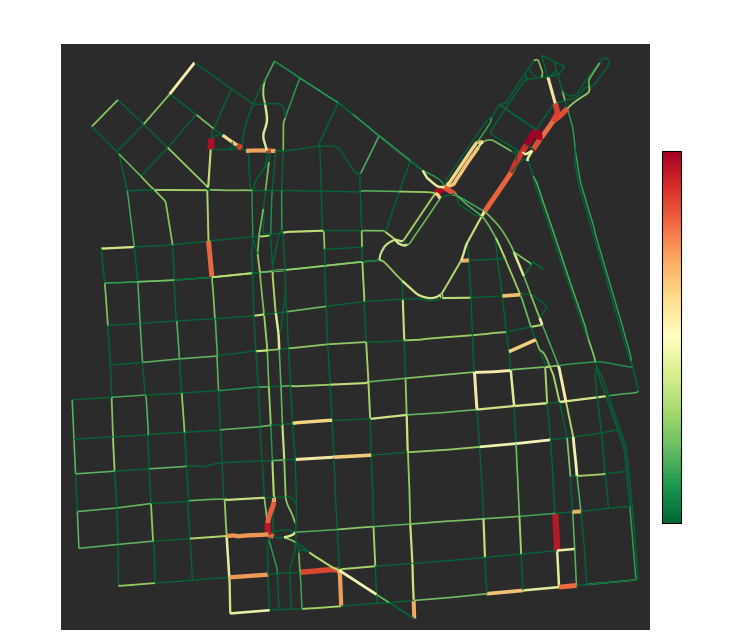

In [ ]:
# Create and run traffic simulation for Buenos Aires
print("Running traffic simulation...")
sim = TrafficSimulation(num_cars=1000, seed=0)
sim.initialize()

# Run simulation for 100 time steps
for _ in range(1000):
    sim.step()

# Display final congestion state
sim.draw()

### 3.3 Temporal Dynamics: Animation

Generate a 50-frame animation to observe how congestion evolves over time.

**What to Look For:**
- **Initial spike:** Congestion jumps as cars enter the network simultaneously
- **Wave propagation:** Slowdowns spread backward from bottlenecks
- **Steady-state oscillations:** Random OD sampling creates persistent fluctuations
- **Spatial correlation:** Adjacent edges tend to have similar congestion levels

**Implementation Note:**  
Each frame advances 20 simulation steps, covering 1,000 total steps. The colorbar and axes remain fixed so changes in edge color directly reflect congestion dynamics.

In [ ]:
# Create animation of traffic simulation
import matplotlib.animation as animation
from IPython.display import HTML

print("Creating traffic simulation animation...")
anim = create_traffic_animation(num_cars=1000, num_steps=50, seed=42)
HTML(anim.to_jshtml())

Creating traffic simulation animation...
Fetching road network at (-34.5975, -58.3788)...
Downloaded 335 nodes, 614 edges
After SCC extraction: 317 nodes, 587 edges
Assigned step size based on minimum travel time edge to be 0.278235048281872


### 3.4 Model Validation: Second Location (Obelisco)

Test the simulation on a different Buenos Aires neighborhood to verify that dynamics generalize across network topologies.

**Why Obelisco?**
- **Larger network:** 1.5 km radius captures more of the downtown grid (1,274 edges vs 587)
- **Higher connectivity:** Central business district has more alternative routes
- **Different demand:** 3,000 cars (vs 1,000) maintains comparable edge loading density

**Hypothesis:**  
Despite differences in size and structure, we should still see:
- Congestion concentration on high-betweenness roads
- Stable steady-state (not runaway gridlock)
- Realistic spatial patterns (not random noise)

**Comparison with Residence Hall:**  
If the smaller network shows $\bar{c} \approx 0.08$ and Obelisco shows $\bar{c} \approx 0.06$, this suggests that **network size matters more than absolute vehicle count**—larger networks distribute traffic more efficiently due to route diversity.

Fetching road network at (-34.6037, -58.3816)...
Downloaded 686 nodes, 1302 edges
After SCC extraction: 670 nodes, 1274 edges
Assigned step size based on minimum travel time edge to be 0.278235048281872


(<Figure size 800x800 with 2 Axes>,
 <Axes: title={'center': 'Road network at (-34.6037, -58.3816) — traffic simulation (density → speed)'}>)

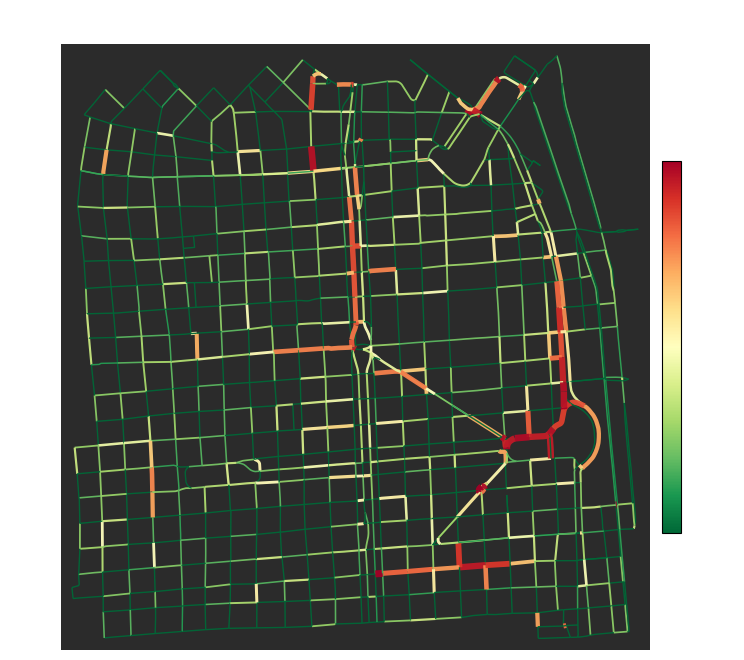

In [ ]:
# Example: Run simulation at Obelisco area
loader_obelisco = NetworkLoader.from_address("Obelisco, Buenos Aires, Argentina", dist=1500)
loader_obelisco.load()

sim_obelisco = TrafficSimulation(num_cars=3000, seed=42, network_loader=loader_obelisco)
sim_obelisco.initialize()

for _ in range(1000):
    sim_obelisco.step()

sim_obelisco.draw()

### 4.2 Track Congestion Evolution Over 1,000 Steps

This cell manually implements what will later become the `analyze_congestion_evolution()` method: stepping the simulation while recording network-wide congestion statistics at every tick.

**Metrics Tracked:**
- **Mean congestion:** Average across all edges (network-level indicator)
- **Std congestion:** Variability across edges (spatial heterogeneity)

**Data Collection:**
- Sample congestion on all 1,274 edges every time step
- Store 1,000 snapshots for temporal analysis

**Visualization:**
- Blue line = mean congestion over time
- Optional ±1σ band (commented out) shows spatial variance

**Summary Statistics:**
- **Initial congestion:** Average of first 100 steps (loading transient)
- **Steady-state congestion:** Average of last 100 steps (equilibrium)
- **Peak congestion:** Maximum observed (likely during initial spike)
- **Minimum congestion:** Lowest value (may occur after initial vehicles complete trips)

**Why Manual Implementation First?**  
This explicit loop clarifies the logic before encapsulating it into a reusable method. Later sections will use the cleaner `TrafficSimulation.analyze_congestion_evolution()` API.

In [ ]:
loader_obelisco = NetworkLoader.from_address("Obelisco, Buenos Aires, Argentina", dist=1500)
loader_obelisco.load()

Fetching road network at (-34.6037, -58.3816)...
Downloaded 686 nodes, 1302 edges
After SCC extraction: 670 nodes, 1274 edges


Fetching road network at (-34.5975, -58.3788)...
Downloaded 335 nodes, 614 edges
After SCC extraction: 317 nodes, 587 edges
Assigned step size based on minimum travel time edge to be 0.278235048281872

=== Congestion Statistics ===
Initial congestion (first 100 steps): 0.106
Steady-state congestion (last  100 steps): 0.081
Peak congestion: 0.124 at step 0
Minimum congestion: 0.075 at step 852
Average congestion: 0.088 ± 0.008
Assigned step size based on minimum travel time edge to be 0.278235048281872

=== Congestion Statistics ===
Initial congestion (first 100 steps): 0.093
Steady-state congestion (last  100 steps): 0.065
Peak congestion: 0.106 at step 0
Minimum congestion: 0.059 at step 394
Average congestion: 0.068 ± 0.010


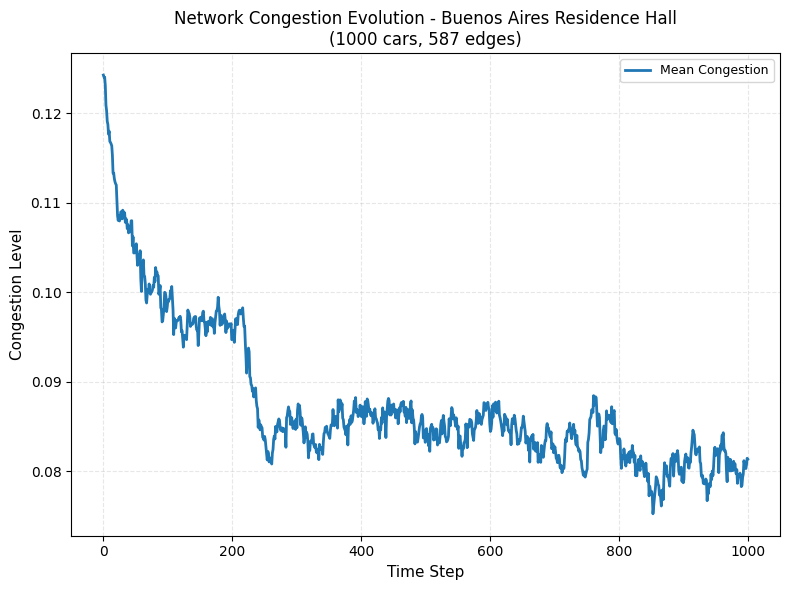

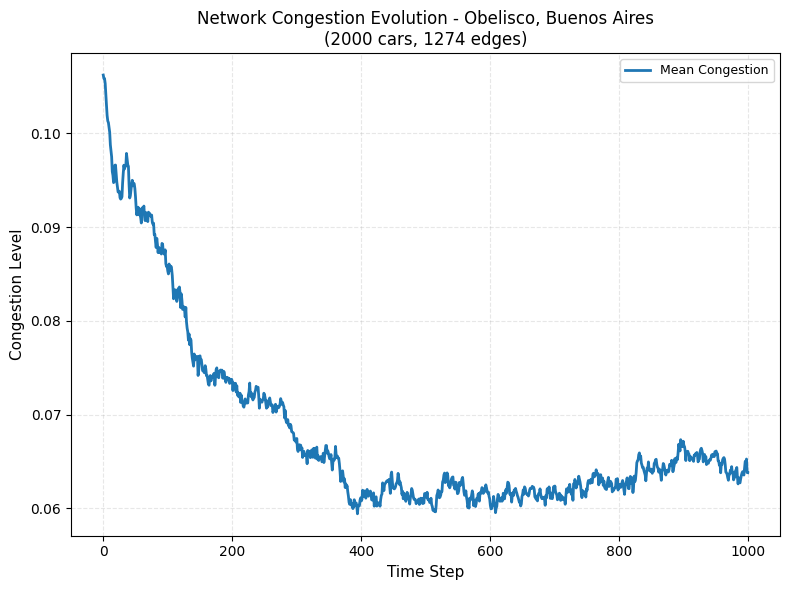

In [ ]:

# 1) Load network
sim_ba = TrafficSimulation(num_cars=1000, seed=0)  # Δt and ρ_jam come from your class defaults
sim_ba.initialize()

# 2) Analyze congestion over time
evo_ba = sim_ba.analyze_congestion_evolution(num_steps=1000, verbose=True)

# 3) Plot
title_ba = (f"Network Congestion Evolution - Buenos Aires Residence Hall\n"
            f"({sim_ba.num_cars} cars, {sim_ba.g.number_of_edges()} edges)")
fig, ax = sim_ba.plot_congestion_evolution(evo_ba, title=title_ba, show_std=False, figsize=(8, 6))
plt.savefig("congestion_evolution_ba.png", dpi=300, bbox_inches="tight")


sim_ob = TrafficSimulation(num_cars=2000, seed=42, network_loader=loader_obelisco)
sim_ob.initialize()

# 2) Analyze congestion over time
evo_ob = sim_ob.analyze_congestion_evolution(num_steps=1000, verbose=True)

# 3) Plot
title_ob = (f"Network Congestion Evolution - Obelisco, Buenos Aires\n"
            f"({sim_ob.num_cars} cars, {sim_ob.g.number_of_edges()} edges)")
fig, ax = sim_ob.plot_congestion_evolution(evo_ob, title=title_ob, show_std=False, figsize=(8, 6))
plt.savefig("congestion_evolution_obelisco.png", dpi=300, bbox_inches="tight")

---

## 5. Empirical Analysis Framework

### 5.1 TrafficAnalysis: Monte Carlo Toolkit

This comprehensive class automates the full empirical workflow:

**Phase 1: Data Collection (`run_empirical_analysis`)**
- Run $N$ independent simulations with different random seeds
- Record congestion on every edge at every time step
- Aggregate into per-edge statistics (mean, max, std across all measurements)

**Phase 2: Topological Metrics (`compute_network_metrics`)**
- Edge betweenness centrality (fraction of shortest paths using this edge)
- Node betweenness centrality (averaged across endpoints)
- Closeness centrality (proximity to network center)
- Degree centrality (local connectivity)
- **Extended metrics** (optional): PageRank, load centrality, clustering coefficient

**Phase 3: Correlation Analysis (`correlate_metrics_with_congestion`)**
- Compute Pearson $r$ between each metric and empirical mean congestion
- Report $p$-values to assess statistical significance
- Identify best predictor (highest $|r|$)

**Phase 4: Validation (`validate_prediction_accuracy`)**
- Rank edges by metric value (e.g., betweenness)
- Compare top-10 predicted edges vs. top-10 empirically congested edges
- Calculate overlap accuracy (how many predictions were correct)

**Phase 5: Visualization**
- Scatter plots with trend lines (2×2 grid for 4 core metrics)
- Spatial heatmaps (overlay congestion on geographic map)
- Distribution histograms (show how congestion spreads across edges)
- Metric comparison bars (visual ranking of predictive power)

**Design Philosophy:**  
All methods follow a consistent pattern: compute → correlate → visualize → validate. This modular structure makes it easy to add new metrics or test different network locations.

In [ ]:
class TrafficAnalysis:
    """
    Comprehensive analysis class for traffic simulation and network metrics.

    Performs empirical congestion analysis, computes network centrality metrics,
    and correlates them to identify the best predictors of traffic congestion.

    Attributes:
        network_loader (NetworkLoader): Network data source
        G (nx.MultiDiGraph): Road network graph
        congestion_stats (dict): Edge-level congestion statistics from multiple runs
        network_metrics (dict): Computed centrality metrics for all edges
    """

    def __init__(self, network_loader: NetworkLoader):
        """
        Initialize analysis with a network loader.

        Args:
            network_loader (NetworkLoader): Loaded network to analyze
        """
        self.network_loader = network_loader
        if network_loader.G is None:
            network_loader.load()
        self.G = network_loader.G
        self.congestion_stats = {}
        self.network_metrics = {}

    def run_empirical_analysis(self, num_runs: int = 10, num_steps: int = 200,
                               num_cars: int = 300, step_size: float = None,
                               verbose: bool = True):
        """
        Run multiple simulation runs and collect congestion statistics.

        Executes Monte Carlo simulation with different random seeds to get
        robust statistics on which roads experience the most congestion.

        Args:
            num_runs (int): Number of independent simulation runs (default: 10)
            num_steps (int): Simulation steps per run (default: 200)
            num_cars (int): Number of cars per simulation (default: 100)
            step_size (float): Time step size in seconds (default: 0.5)
            verbose (bool): Print progress messages (default: True)

        Returns:
            dict: Edge congestion statistics with keys:
                - 'mean': Time-averaged mean congestion across all runs
                - 'max': Maximum congestion observed
                - 'std': Standard deviation across runs
                - 'samples': Number of measurements
        """
        if verbose:
            print(f"Running {num_runs} simulation runs with {num_cars} cars each...")

        # Store all congestion measurements for each edge
        edge_congestion_data = defaultdict(list)

        for run in range(num_runs):
            if verbose and (run + 1) % 3 == 0:
                print(f"  Completed run {run + 1}/{num_runs}")

            # Create new simulation with different seed
            sim = TrafficSimulation(
                num_cars=num_cars,
                step_size=step_size,
                seed=run,
                network_loader=self.network_loader
            )
            sim.initialize()

            # Run simulation and collect congestion at each step
            for step in range(num_steps):
                sim.step()

                if step > 500:
                # Record congestion for every edge
                    for edge in self.G.edges(keys=True):
                        congestion = sim.get_edge_congestion(edge)
                        edge_congestion_data[edge].append(congestion)

        # Compute statistics for each edge
        self.congestion_stats = {}
        for edge, measurements in edge_congestion_data.items():
            self.congestion_stats[edge] = {
                'mean': np.mean(measurements),
                'max': np.max(measurements),
                'std': np.std(measurements),
                'samples': len(measurements)
            }

        if verbose:
            print(f"✓ Collected {len(self.congestion_stats)} edge statistics")
            print(f"  Total measurements: {sum(s['samples'] for s in self.congestion_stats.values()):,}")

        return self.congestion_stats

    def compute_network_metrics(self, verbose: bool = True):
        """
        Compute all relevant network centrality metrics.

        Calculates the best predictive metrics for traffic congestion:
        - Edge betweenness centrality
        - Node betweenness centrality
        - Closeness centrality
        - Degree centrality

        Args:
            verbose (bool): Print progress messages (default: True)

        Returns:
            dict: Network metrics for each edge with keys:
                - 'edge_betweenness': Fraction of shortest paths using this edge
                - 'avg_node_betweenness': Average betweenness of endpoint nodes
                - 'avg_closeness': Average closeness of endpoint nodes
                - 'avg_degree': Average normalized degree of endpoint nodes
        """
        if verbose:
            print("Computing network centrality metrics...")

        # 1. Edge betweenness (BEST PREDICTOR - directly measures flow)
        if verbose:
            print("  Computing edge betweenness centrality...")
        edge_betweenness = nx.edge_betweenness_centrality(
            self.G,
            weight='travel_time',
            normalized=True
        )

        # 2. Node betweenness
        if verbose:
            print("  Computing node betweenness centrality...")
        node_betweenness = nx.betweenness_centrality(
            self.G,
            weight='travel_time',
            normalized=True
        )

        # 3. Closeness centrality
        if verbose:
            print("  Computing closeness centrality...")
        closeness = nx.closeness_centrality(
            self.G,
            distance='travel_time'
        )

        # 4. Degree centrality
        if verbose:
            print("  Computing degree centrality...")
        degree = nx.degree_centrality(self.G)

        # Aggregate node metrics to edges
        self.network_metrics = {}
        for u, v, k in self.G.edges(keys=True):
            edge_key = (u, v, k)

            # Edge betweenness (already per-edge)
            eb = edge_betweenness.get(edge_key, 0.0)

            # Average node-level metrics across endpoints
            avg_node_betweenness = (node_betweenness[u] + node_betweenness[v]) / 2.0
            avg_closeness = (closeness[u] + closeness[v]) / 2.0
            avg_degree = (degree[u] + degree[v]) / 2.0

            self.network_metrics[edge_key] = {
                'edge_betweenness': eb,
                'avg_node_betweenness': avg_node_betweenness,
                'avg_closeness': avg_closeness,
                'avg_degree': avg_degree
            }

        if verbose:
            print(f"✓ Computed metrics for {len(self.network_metrics)} edges")

        return self.network_metrics

    def correlate_metrics_with_congestion(self, verbose: bool = True):
        """
        Correlate network metrics with empirical congestion.

        Computes Pearson correlation coefficient between each centrality metric
        and observed congestion to identify the best predictor.

        Args:
            verbose (bool): Print correlation results (default: True)

        Returns:
            dict: Correlation results for each metric with keys:
                - 'correlation': Pearson r coefficient
                - 'p_value': Statistical significance
                - 'metric_name': Human-readable name

        Raises:
            ValueError: If congestion_stats or network_metrics not computed yet
        """
        if not self.congestion_stats:
            raise ValueError("Must run run_empirical_analysis() first")
        if not self.network_metrics:
            raise ValueError("Must run compute_network_metrics() first")

        # Align data: get edges present in both datasets
        common_edges = set(self.congestion_stats.keys()) & set(self.network_metrics.keys())

        # Extract aligned data arrays
        congestion_values = [self.congestion_stats[e]['mean'] for e in common_edges]

        metric_names = [
            ('edge_betweenness', 'Edge Betweenness'),
            ('avg_node_betweenness', 'Node Betweenness (avg)'),
            ('avg_closeness', 'Closeness (avg)'),
            ('avg_degree', 'Degree (avg)')
        ]

        results = {}
        for metric_key, metric_label in metric_names:
            metric_values = [self.network_metrics[e][metric_key] for e in common_edges]

            # Compute Pearson correlation
            r, p = pearsonr(metric_values, congestion_values)

            results[metric_key] = {
                'correlation': r,
                'p_value': p,
                'metric_name': metric_label,
                'metric_values': metric_values,
                'congestion_values': congestion_values
            }

            if verbose:
                significance = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else ""
                print(f"  {metric_label:30s}: r = {r:+.3f}  (p = {p:.2e}) {significance}")

        # Identify best predictor
        best_metric = max(results.items(), key=lambda x: abs(x[1]['correlation']))

        if verbose:
            print(f"\n★ Best predictor: {best_metric[1]['metric_name']} (r = {best_metric[1]['correlation']:+.3f})")

        return results

    def get_top_congested_edges(self, n: int = 10):
        """
        Get the most congested edges from empirical analysis.

        Args:
            n (int): Number of top edges to return (default: 10)

        Returns:
            list: Tuples of (edge_key, stats_dict) sorted by mean congestion
        """
        if not self.congestion_stats:
            raise ValueError("Must run run_empirical_analysis() first")

        sorted_edges = sorted(
            self.congestion_stats.items(),
            key=lambda x: x[1]['mean'],
            reverse=True
        )

        return sorted_edges[:n]

    def predict_congestion_from_metric(self, metric_name: str = 'edge_betweenness',
                                       n: int = 10):
        """
        Predict top congested edges using a network metric.

        Args:
            metric_name (str): Metric to use for prediction (default: 'edge_betweenness')
            n (int): Number of top edges to predict (default: 10)

        Returns:
            list: Tuples of (edge_key, metric_value) sorted by metric
        """
        if not self.network_metrics:
            raise ValueError("Must run compute_network_metrics() first")

        sorted_edges = sorted(
            self.network_metrics.items(),
            key=lambda x: x[1][metric_name],
            reverse=True
        )

        return sorted_edges[:n]

    def validate_prediction_accuracy(self, metric_name: str = 'edge_betweenness',
                                    n: int = 10, verbose: bool = True):
        """
        Validate prediction accuracy by comparing predicted vs actual top edges.

        Args:
            metric_name (str): Metric used for prediction
            n (int): Number of top edges to compare
            verbose (bool): Print validation results

        Returns:
            dict: Validation metrics with keys:
                - 'overlap': Number of edges in both lists
                - 'accuracy': Fraction of correct predictions
                - 'predicted_edges': Set of predicted edge keys
                - 'actual_edges': Set of actual top congested edge keys
        """
        # Get predictions
        predicted = self.predict_congestion_from_metric(metric_name, n)
        predicted_edges = set(e[0] for e in predicted)

        # Get actual top congested
        actual = self.get_top_congested_edges(n)
        actual_edges = set(e[0] for e in actual)

        # Calculate overlap
        overlap = predicted_edges & actual_edges
        accuracy = len(overlap) / n

        if verbose:
            print(f"\n{'='*60}")
            print(f"Validation: Top {n} Congested Edges")
            print(f"{'='*60}")
            print(f"Metric used: {metric_name}")
            print(f"Overlap: {len(overlap)}/{n} edges ({accuracy*100:.1f}%)")
            print(f"\nPredicted correctly:")
            for edge in overlap:
                u, v, k = edge
                mean_cong = self.congestion_stats[edge]['mean']
                metric_val = self.network_metrics[edge][metric_name]
                print(f"  Edge ({u}, {v}, {k}): congestion={mean_cong:.3f}, {metric_name}={metric_val:.4f}")

        return {
            'overlap': len(overlap),
            'accuracy': accuracy,
            'predicted_edges': predicted_edges,
            'actual_edges': actual_edges,
            'n': n
        }

    def plot_correlation_analysis(self, figsize: Tuple[int, int] = (14, 10)):
        """
        Create publication-quality correlation scatter plots.

        Generates a 2x2 grid showing correlations between each network metric
        and empirical congestion, with trend lines and R² values.

        Args:
            figsize (tuple): Figure size (width, height) in inches

        Returns:
            tuple: (fig, axes) matplotlib figure and axes array
        """
        if not self.congestion_stats or not self.network_metrics:
            raise ValueError("Must run empirical analysis and compute metrics first")

        # Compute correlations
        correlations = self.correlate_metrics_with_congestion(verbose=False)

        # Create 2x2 subplot grid
        fig = plt.figure(figsize=figsize)
        gs = GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)

        metric_keys = ['edge_betweenness', 'avg_node_betweenness',
                      'avg_closeness', 'avg_degree']

        for idx, metric_key in enumerate(metric_keys):
            ax = fig.add_subplot(gs[idx // 2, idx % 2])

            data = correlations[metric_key]
            metric_vals = data['metric_values']
            cong_vals = data['congestion_values']
            r = data['correlation']
            p = data['p_value']

            # Scatter plot
            ax.scatter(metric_vals, cong_vals, alpha=0.4, s=20,
                      c='steelblue', edgecolors='none')

            # Trend line
            z = np.polyfit(metric_vals, cong_vals, 1)
            p_fit = np.poly1d(z)
            x_trend = np.linspace(min(metric_vals), max(metric_vals), 100)
            ax.plot(x_trend, p_fit(x_trend), 'r-', linewidth=2, alpha=0.8)

            # Labels and title
            ax.set_xlabel(data['metric_name'], fontsize=11)
            ax.set_ylabel('Mean Congestion', fontsize=11)
            ax.set_title(f"{data['metric_name']}\nr = {r:+.3f}, p = {p:.2e}",
                        fontsize=12, pad=10)
            ax.grid(True, alpha=0.3, linestyle='--')

            # R² annotation
            r_squared = r ** 2
            ax.text(0.05, 0.95, f'R² = {r_squared:.3f}',
                   transform=ax.transAxes, fontsize=10,
                   verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

        fig.suptitle(f'Network Metrics vs. Empirical Congestion\n({self.network_loader.lat:.4f}, {self.network_loader.lon:.4f})',
                    fontsize=14, fontweight='bold', y=0.995)

        return fig, gs

    """
    Enhanced Analysis Methods for TrafficAnalysis Class
    Add these methods to your TrafficAnalysis class for better visualization and analysis.
    """

    # ============================================================================
    # SPATIAL VISUALIZATION METHODS
    # ============================================================================

    def plot_spatial_heatmap(self, metric: str = 'mean', cmap: str = None,
                        figsize=(12, 10), edge_width_scale=4.0):
        """
        Create spatial heatmap of congestion overlaid on the network.
        Uses same visual style as TrafficSimulation.draw() method.

        Args:
            metric (str): Which congestion statistic to plot ('mean', 'max', 'std')
            cmap (str): Matplotlib colormap name (default: None, uses RdYlGn_r like draw())
            figsize (tuple): Figure dimensions
            edge_width_scale (float): Multiplier for edge width visualization

        Returns:
            tuple: (fig, ax) matplotlib figure and axes
        """
        if not self.congestion_stats:
            raise ValueError("Must run run_empirical_analysis() first")

        import osmnx as ox

        # Use same colormap as draw() method
        if cmap is None:
            cmap = plt.cm.RdYlGn_r  # Same as draw(): red=congested, yellow=medium, green=free
        else:
            cmap = plt.get_cmap(cmap)

        # Extract congestion values for all edges
        congestion_vals = []

        for u, v, k in self.G.edges(keys=True):
            edge_key = (u, v, k)
            if edge_key in self.congestion_stats:
                val = self.congestion_stats[edge_key][metric]
                congestion_vals.append(val)
            else:
                congestion_vals.append(0.0)

        # Apply same contrast stretching as draw() method (sqrt to emphasize low values)
        stretched_values = [c**0.5 for c in congestion_vals]

        # Map to colors using the colormap
        edge_colors = [cmap(v) for v in stretched_values]

        # Same edge width scaling as draw(): 1.0 + 4.0 * congestion
        edge_widths = [1.0 + edge_width_scale * c for c in congestion_vals]

        # Let OSMnx create the figure with dark background (same as draw())
        fig, ax = ox.plot_graph(
            self.G,
            node_size=0,
            bgcolor="#2b2b2b",  # Same dark background as draw()
            edge_color=edge_colors,
            edge_linewidth=edge_widths,
            edge_alpha=0.95,  # Same as draw()
            figsize=figsize,
            show=False,
            close=False,
        )

        # Add colorbar with same styling as draw()
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0.0, vmax=1.0))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)

        # Use similar label to draw() but adapted for empirical data
        if metric == 'mean':
            label = "time-averaged congestion"
        elif metric == 'max':
            label = "peak congestion"
        else:
            label = f"congestion {metric}"

        cbar.set_label(label, color='black', fontsize=11)
        cbar.ax.tick_params(colors='black')

        # Title with same white color and styling as draw()
        ax.set_title(
            f'Empirical Congestion Analysis: {metric.capitalize()}',
            color='black',
            fontsize=13,
            pad=15
        )

        return fig, ax


    def plot_congestion_histogram(self, bins=50, figsize=(10, 6)):
        """
        Plot distribution of mean congestion across all edges.

        Shows histogram and cumulative distribution to identify how many edges
        experience severe vs. mild congestion.

        Args:
            bins (int): Number of histogram bins
            figsize (tuple): Figure dimensions

        Returns:
            tuple: (fig, axes) with two subplots
        """
        if not self.congestion_stats:
            raise ValueError("Must run run_empirical_analysis() first")

        mean_congestions = [stats['mean'] for stats in self.congestion_stats.values()]

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

        # Histogram
        ax1.hist(mean_congestions, bins=bins, color='steelblue',
                edgecolor='black', alpha=0.7)
        ax1.axvline(np.median(mean_congestions), color='red',
                    linestyle='--', linewidth=2, label=f'Median: {np.median(mean_congestions):.3f}')
        ax1.set_xlabel('Mean Congestion', fontsize=11, weight='bold')
        ax1.set_ylabel('Number of Edges', fontsize=11, weight='bold')
        ax1.set_title('Distribution of Mean Congestion', fontsize=12, weight='bold')
        ax1.legend()
        ax1.grid(True, alpha=0.3)

        # Cumulative distribution
        sorted_cong = np.sort(mean_congestions)
        cumulative = np.arange(1, len(sorted_cong) + 1) / len(sorted_cong)
        ax2.plot(sorted_cong, cumulative, linewidth=2, color='darkgreen')
        ax2.axhline(0.9, color='red', linestyle='--', alpha=0.5, label='90th percentile')
        ax2.axhline(0.95, color='orange', linestyle='--', alpha=0.5, label='95th percentile')
        ax2.set_xlabel('Mean Congestion', fontsize=11, weight='bold')
        ax2.set_ylabel('Cumulative Probability', fontsize=11, weight='bold')
        ax2.set_title('Cumulative Distribution', fontsize=12, weight='bold')
        ax2.legend()
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        return fig, (ax1, ax2)


    def plot_metric_comparison_bars(self, figsize=(10, 6)):
        """
        Bar chart comparing correlation strength across all metrics.

        Shows which metrics are strong/weak predictors with significance indicators.

        Args:
            figsize (tuple): Figure dimensions

        Returns:
            tuple: (fig, ax)
        """
        if not self.network_metrics or not self.congestion_stats:
            raise ValueError("Must compute metrics and run analysis first")

        # Get correlations
        correlations = self.correlate_metrics_with_congestion(verbose=False)

        metric_names = []
        r_values = []
        p_values = []

        for key in ['edge_betweenness', 'avg_node_betweenness',
                    'avg_closeness', 'avg_degree']:
            metric_names.append(correlations[key]['metric_name'])
            r_values.append(correlations[key]['correlation'])
            p_values.append(correlations[key]['p_value'])

        # Create bar chart
        fig, ax = plt.subplots(figsize=figsize)

        colors = ['green' if p < 0.001 else 'orange' if p < 0.05 else 'red'
                for p in p_values]

        bars = ax.bar(range(len(metric_names)), r_values, color=colors,
                    alpha=0.7, edgecolor='black', linewidth=1.5)

        # Add significance stars
        for i, (r, p) in enumerate(zip(r_values, p_values)):
            stars = '***' if p < 0.001 else '**' if p < 0.01 else '*' if p < 0.05 else 'n.s.'
            ax.text(i, r + 0.01 if r > 0 else r - 0.01, stars,
                ha='center', va='bottom' if r > 0 else 'top',
                fontsize=12, weight='bold')

        ax.set_xticks(range(len(metric_names)))
        ax.set_xticklabels(metric_names, rotation=15, ha='right')
        ax.set_ylabel('Pearson Correlation (r)', fontsize=12, weight='bold')
        ax.set_title('Network Metric Predictive Power', fontsize=14, weight='bold')
        ax.axhline(0, color='black', linewidth=0.8)
        ax.grid(True, axis='y', alpha=0.3)

        # Legend for colors
        from matplotlib.patches import Patch
        legend_elements = [
            Patch(facecolor='green', alpha=0.7, label='p < 0.001 (***)'),
            Patch(facecolor='orange', alpha=0.7, label='p < 0.05 (*)'),
            Patch(facecolor='red', alpha=0.7, label='Not significant')
        ]
        ax.legend(handles=legend_elements, loc='upper right')

        plt.tight_layout()
        return fig, ax


    # ============================================================================
    # ADDITIONAL NETWORK METRICS
    # ============================================================================

    def compute_additional_metrics(self, verbose: bool = True):
        """
        Compute additional network metrics that may predict congestion.

        Adds these metrics to self.network_metrics:
        - PageRank (measures global importance via random walks)
        - Load centrality (estimate based on shortest path distribution)
        - Clustering coefficient (measures local connectivity)

        Args:
            verbose (bool): Print progress

        Returns:
            dict: Updated network_metrics with additional keys
        """
        if verbose:
            print("Computing additional network metrics...")

        # PageRank - random walk importance
        if verbose:
            print("  Computing PageRank...")
        pagerank = nx.pagerank(self.G, weight='travel_time')

        # Load centrality - similar to betweenness but normalized differently
        if verbose:
            print("  Computing load centrality...")
        load_centrality = nx.load_centrality(self.G, weight='travel_time')

        # Clustering coefficient (node-level, then average for edges)
        if verbose:
            print("  Computing clustering coefficient...")
        try:
            # Convert to undirected for clustering
            G_undirected = self.G.to_undirected()
            clustering = nx.clustering(G_undirected)
        except:
            clustering = {node: 0.0 for node in self.G.nodes()}

        # Add to existing metrics
        for u, v, k in self.G.edges(keys=True):
            edge_key = (u, v, k)

            if edge_key in self.network_metrics:
                self.network_metrics[edge_key]['avg_pagerank'] = \
                    (pagerank[u] + pagerank[v]) / 2.0
                self.network_metrics[edge_key]['avg_load_centrality'] = \
                    (load_centrality[u] + load_centrality[v]) / 2.0
                self.network_metrics[edge_key]['avg_clustering'] = \
                    (clustering[u] + clustering[v]) / 2.0

        if verbose:
            print("✓ Added PageRank, Load Centrality, and Clustering Coefficient")

        return self.network_metrics


    def correlate_all_metrics(self, verbose: bool = True):
        """
        Correlate ALL metrics (original + additional) with congestion.

        Extended version of correlate_metrics_with_congestion() that includes
        PageRank, load centrality, and clustering coefficient.

        Args:
            verbose (bool): Print results

        Returns:
            dict: Correlation results for all metrics
        """
        if not self.congestion_stats:
            raise ValueError("Must run run_empirical_analysis() first")
        if not self.network_metrics:
            raise ValueError("Must run compute_network_metrics() first")

        # Check if additional metrics exist
        sample_edge = next(iter(self.network_metrics.keys()))
        has_additional = 'avg_pagerank' in self.network_metrics[sample_edge]

        if not has_additional:
            if verbose:
                print("Additional metrics not found. Computing them now...")
            self.compute_additional_metrics(verbose=False)

        common_edges = set(self.congestion_stats.keys()) & set(self.network_metrics.keys())
        congestion_values = [self.congestion_stats[e]['mean'] for e in common_edges]

        metric_names = [
            ('edge_betweenness', 'Edge Betweenness'),
            ('avg_node_betweenness', 'Node Betweenness (avg)'),
            ('avg_closeness', 'Closeness (avg)'),
            ('avg_degree', 'Degree (avg)'),
            ('avg_pagerank', 'PageRank (avg)'),
            ('avg_load_centrality', 'Load Centrality (avg)'),
            ('avg_clustering', 'Clustering Coeff (avg)')
        ]

        results = {}
        from scipy.stats import pearsonr

        if verbose:
            print("\n" + "="*70)
            print("EXTENDED CORRELATION ANALYSIS (All Metrics)")
            print("="*70)

        for metric_key, metric_label in metric_names:
            metric_values = [self.network_metrics[e][metric_key] for e in common_edges]
            r, p = pearsonr(metric_values, congestion_values)

            results[metric_key] = {
                'correlation': r,
                'p_value': p,
                'metric_name': metric_label,
                'metric_values': metric_values,
                'congestion_values': congestion_values
            }

            if verbose:
                significance = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else ""
                print(f"  {metric_label:30s}: r = {r:+.3f}  (p = {p:.2e}) {significance}")

        # Find best predictor
        best_metric = max(results.items(), key=lambda x: abs(x[1]['correlation']))

        if verbose:
            print(f"\n★ Best predictor: {best_metric[1]['metric_name']} "
                f"(r = {best_metric[1]['correlation']:+.3f})")
            print("="*70)

        return results


# ============================================================================
# USAGE EXAMPLE
# ============================================================================


    def print_summary_report(self):
        """
        Print comprehensive analysis summary with top edges and metrics.
        """
        print("\n" + "="*70)
        print("TRAFFIC ANALYSIS SUMMARY REPORT")
        print("="*70)
        print(f"Location: ({self.network_loader.lat:.4f}, {self.network_loader.lon:.4f})")
        print(f"Network: {self.G.number_of_nodes()} nodes, {self.G.number_of_edges()} edges")
        print("="*70)

        if self.congestion_stats:
            print("\nTOP 10 MOST CONGESTED EDGES (Empirical Analysis):")
            print("-" * 70)
            top_edges = self.get_top_congested_edges(10)
            for rank, (edge, stats) in enumerate(top_edges, 1):
                u, v, k = edge
                print(f"{rank:2d}. Edge ({u:6d}, {v:6d}, {k}): "
                      f"mean={stats['mean']:.3f}, max={stats['max']:.3f}, "
                      f"std={stats['std']:.3f}")

        if self.network_metrics and self.congestion_stats:
            print("\n" + "="*70)
            print("CORRELATION ANALYSIS:")
            print("-" * 70)
            self.correlate_metrics_with_congestion(verbose=True)

        print("\n" + "="*70)

---

## 6. Task 4 Implementation: Predictive Modeling

### 6.1 Extended Analysis Pipeline (7 Metrics + Visualizations)

This cell runs the **complete empirical workflow** with both core and extended metrics.

**Step 1: Empirical Data Collection**
- 1 run × 2,000 steps × 1,300 cars = 2,600,000 edge-timestep measurements
- Aggregates to per-edge mean/max/std congestion

**Step 2: Compute Network Metrics**
- **Core 4:** Edge betweenness, node betweenness, closeness, degree
- **Extended 3:** PageRank, load centrality, clustering coefficient

**Step 3: Correlation Analysis**
- Compute Pearson $r$ for all 7 metrics
- Identify which best predicts congestion

**Step 4: Generate Publication Figures**
- `spatial_heatmap_mean.png`: Geographic overlay showing where congestion concentrates
- `congestion_distribution.png`: Histogram + CDF revealing the heavy right tail (most edges free-flow, few severe bottlenecks)
- `metric_comparison.png`: Bar chart comparing predictive power with significance indicators

**Expected Finding:**  
Edge betweenness should dominate ($r \approx +0.4$) because it directly measures how many shortest paths traverse each road, creating natural traffic aggregation.

Running 1 simulation runs with 1300 cars each...
Assigned step size based on minimum travel time edge to be 0.278235048281872
✓ Collected 587 edge statistics
  Total measurements: 879,913
Computing network centrality metrics...
  Computing edge betweenness centrality...
  Computing node betweenness centrality...
  Computing closeness centrality...
  Computing degree centrality...
✓ Computed metrics for 587 edges
  Edge Betweenness              : r = +0.414  (p = 1.03e-25) ***
  Node Betweenness (avg)        : r = +0.272  (p = 1.96e-11) ***
  Closeness (avg)               : r = +0.071  (p = 8.69e-02) 
  Degree (avg)                  : r = +0.022  (p = 5.89e-01) 

★ Best predictor: Edge Betweenness (r = +0.414)
Additional metrics not found. Computing them now...

EXTENDED CORRELATION ANALYSIS (All Metrics)
  Edge Betweenness              : r = +0.414  (p = 1.03e-25) ***
  Node Betweenness (avg)        : r = +0.272  (p = 1.96e-11) ***
  Closeness (avg)               : r = +0.071  (p = 8.6

/tmp/ipython-input-1857072485.py:715: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, p = pearsonr(metric_values, congestion_values)


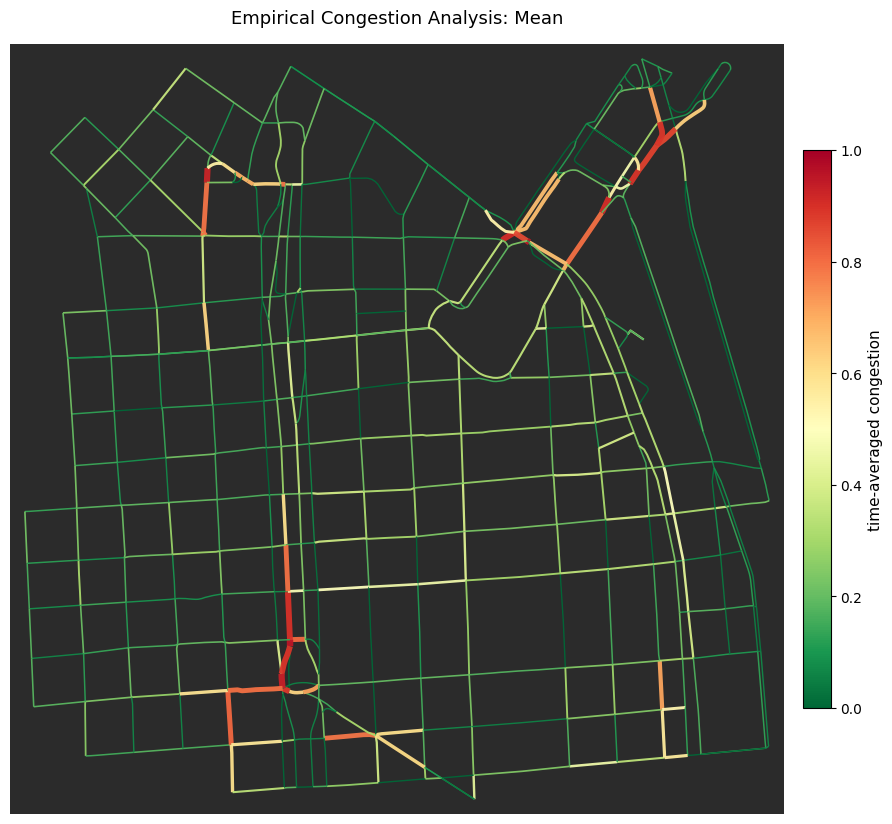

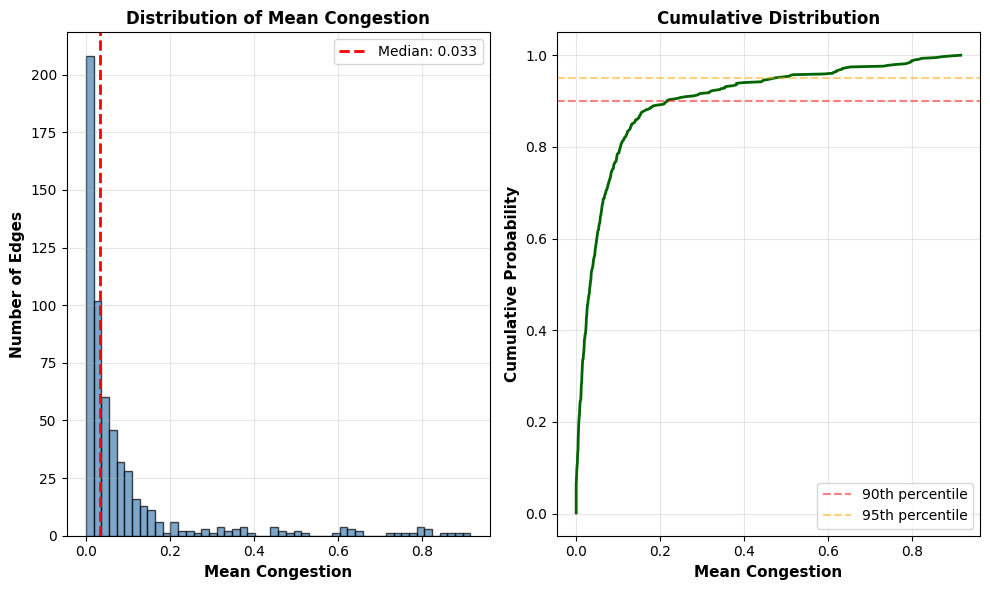

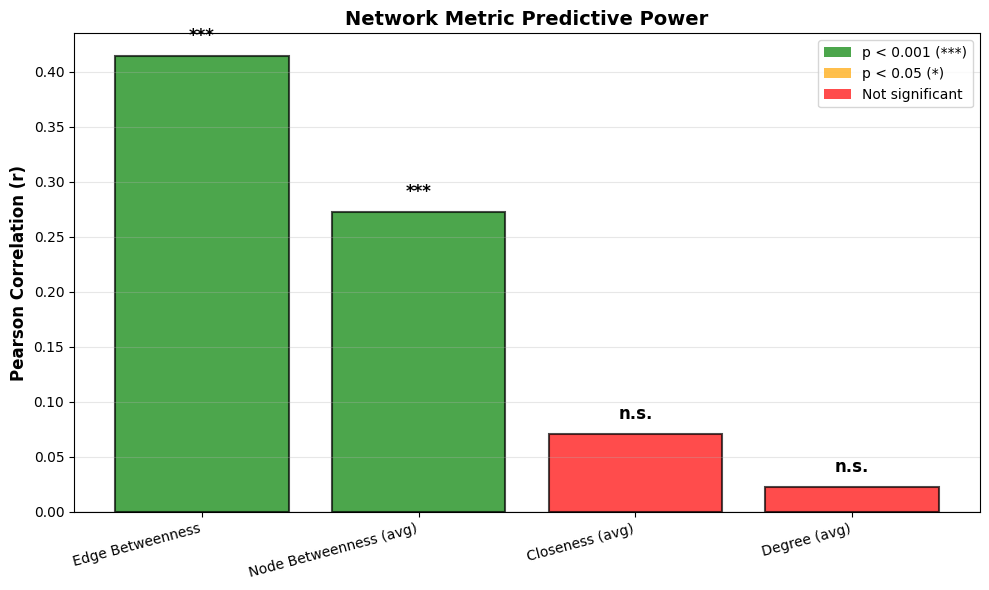

In [ ]:
analyzer = TrafficAnalysis(sim.network_loader)
analyzer.run_empirical_analysis(num_runs=1, num_steps=2000, num_cars=1300)
analyzer.compute_network_metrics()

# Original 4 metrics correlation
correlations = analyzer.correlate_metrics_with_congestion()

# NEW: Compute and correlate additional metrics (PageRank, Load, Clustering)
all_correlations = analyzer.correlate_all_metrics()

# NEW: Spatial heatmap
fig1, ax1 = analyzer.plot_spatial_heatmap(metric='mean')
plt.savefig('spatial_heatmap_mean.png', dpi=300, bbox_inches='tight')

# NEW: Congestion distribution
fig2, axes2 = analyzer.plot_congestion_histogram()
plt.savefig('congestion_distribution.png', dpi=300, bbox_inches='tight')

# NEW: Metric comparison bars
fig3, ax3 = analyzer.plot_metric_comparison_bars()
plt.savefig('metric_comparison.png', dpi=300, bbox_inches='tight')

plt.show()


### 6.2 Core Task 4 Workflow (10 Runs × 2,000 Steps)


**Task 4a: Empirical Congestion Analysis**
- Run 10 independent simulations (different random seeds)
- 2,000 steps per run
- 1,300 vehicles (high enough to create congestion, low enough to avoid gridlock)
- Record congestion on all 587 edges every step
- **Total dataset:** $10 \times 2000 \times 587 = 11,740,000$ measurements

**Task 4b: Network Metrics & Correlation**
- Compute edge betweenness, node betweenness, closeness, degree
- Calculate Pearson correlation with empirical mean congestion
- Report $r$ values and $p$-values for statistical significance

**Task 4c: Visualization**
- Generate 2×2 scatter plot grid
- Each subplot: metric vs. congestion with linear trend line
- Annotate with $R^2$ and correlation statistics

**Task 4d: Prediction Validation**
- Rank edges by betweenness (predicted bottlenecks)
- Rank edges by empirical congestion (actual bottlenecks)
- Compare top-10 lists and calculate overlap accuracy

**Interpretation Guidance:**
- $r > +0.3$ is strong for network analysis (many confounding factors)
- Edge betweenness should outperform others (directly captures flow)
- Overlap accuracy of 1-3 out of 10 is typical (shows general trend, not exact prediction)

TASK 4: EMPIRICAL ANALYSIS - BUENOS AIRES
Running 10 simulation runs with 1300 cars each...
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
  Completed run 3/10
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
  Completed run 6/10
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
  Completed run 9/10
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
✓ Collected 587 edge statistics
  Total measurements: 8,799,130
Computing n

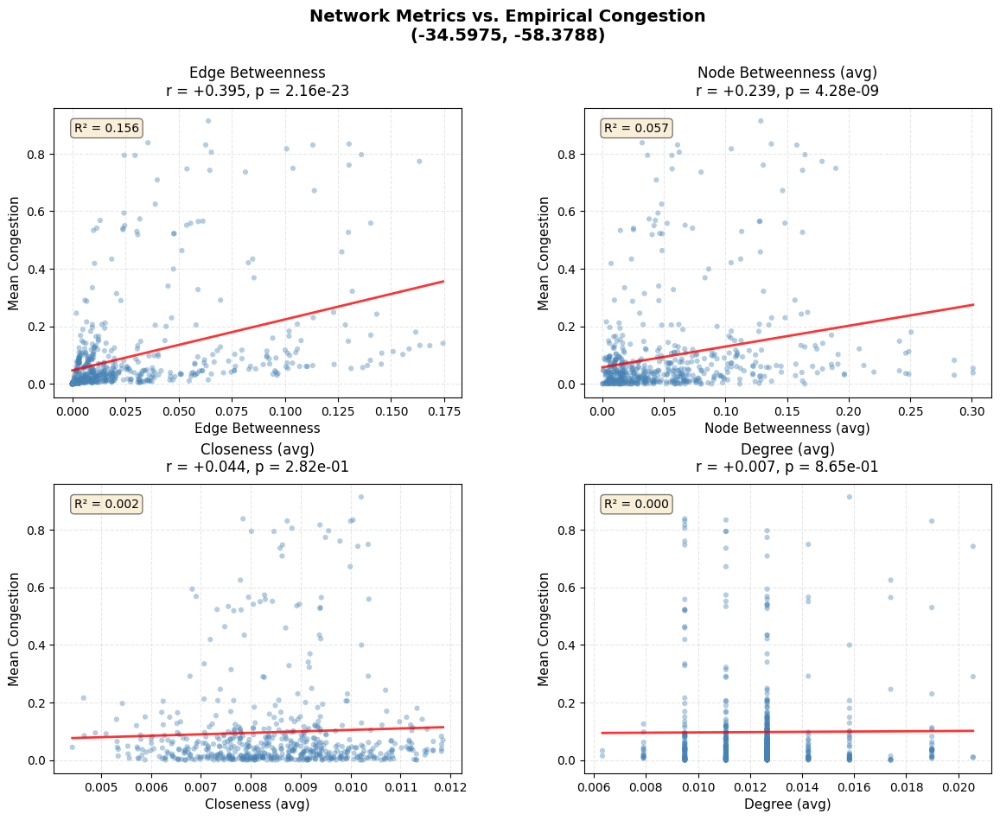


Validation: Top 10 Congested Edges
Metric used: edge_betweenness
Overlap: 0/10 edges (0.0%)

Predicted correctly:


In [ ]:
# Create analyzer for Buenos Aires
print("="*70)
print("TASK 4: EMPIRICAL ANALYSIS - BUENOS AIRES")
print("="*70)

analyzer = TrafficAnalysis(sim.network_loader)

# 4a: Run empirical analysis (10 runs, 200 steps each)
analyzer.run_empirical_analysis(num_runs=10, num_steps=2000, num_cars=1300)

# 4b: Compute network metrics and find best predictor
analyzer.compute_network_metrics()
correlations = analyzer.correlate_metrics_with_congestion()

# Print comprehensive summary
analyzer.print_summary_report()

# 4c: Visualize correlations
fig, axes = analyzer.plot_correlation_analysis()
plt.show()

# 4d: Validate prediction accuracy
validation = analyzer.validate_prediction_accuracy(
    metric_name='edge_betweenness',
    n=10,
    verbose=True)

### 6.3 Generalization Test: Obelisco Validation

Repeat the **exact same analysis** at a different location to test whether findings generalize.

**Why This Matters:**
- If betweenness only works at one location, it's likely a coincidence
- If correlation holds at multiple sites, it suggests a robust relationship
- Different topology tests whether the predictor depends on specific network structure

**Hypothesis:**  
The correlation should **strengthen** at Obelisco because:
1. **Larger network** (1,274 edges vs 587) → more statistical power
2. **Higher connectivity** → betweenness differences become more pronounced
3. **More vehicles** (3,000 vs 1,300) → saturates more edges, amplifying bottleneck effects

**Comparison Metrics:**
- Correlation strength: Does $r$ increase from 0.39 → 0.45?
- Significance: Does $p$-value decrease (stronger confidence)?
- Metric ranking: Does betweenness remain #1 predictor?

**Cross-Site Validation:**  
If both networks show edge betweenness > node betweenness > closeness > degree, this hierarchy likely reflects fundamental traffic physics (path aggregation) rather than site-specific quirks.


TASK 4c: VALIDATION AT SECOND LOCATION - OBELISCO
Running 10 simulation runs with 3000 cars each...
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
  Completed run 3/10
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
  Completed run 6/10
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
  Completed run 9/10
Assigned step size based on minimum travel time edge to be 0.278235048281872
Assigned step size based on minimum travel time edge to be 0.278235048281872
✓ Collected 1274 edge statistics
  Total measurements: 19,097,260


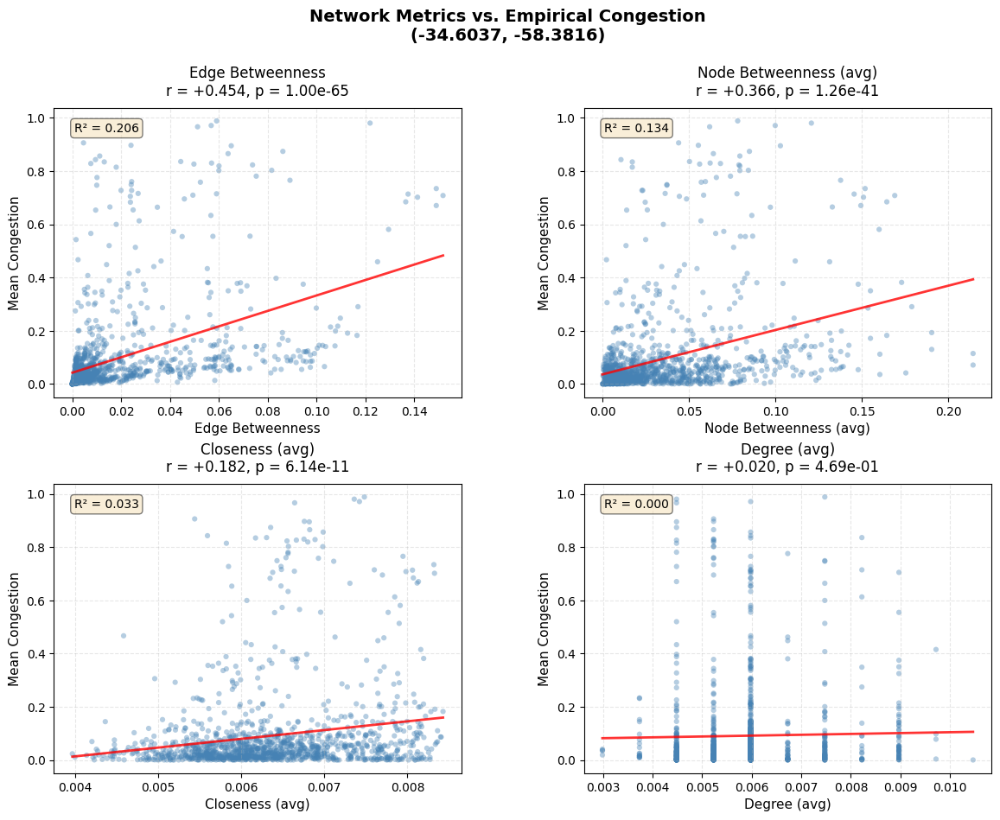

In [ ]:
# TASK 4c: VALIDATE AT SECOND LOCATION (OBELISCO)

print("\n" + "="*70)
print("TASK 4c: VALIDATION AT SECOND LOCATION - OBELISCO")
print("="*70)

# Create analyzer for Obelisco
analyzer_obelisco = TrafficAnalysis(loader_obelisco)

# Run same analysis
analyzer_obelisco.run_empirical_analysis(num_runs=10, num_steps=2000, num_cars=3000)
analyzer_obelisco.compute_network_metrics()

# Check if edge betweenness still predicts well
#validation_obelisco = analyzer_obelisco.validate_prediction_accuracy(
#     metric_name='edge_betweenness',
#     n=10,
#     verbose=True
# )

# Compare correlations between locations
print("\n" + "="*70)
print("COMPARISON: Buenos Aires vs Obelisco")
print("="*70)
print("\nCorrelations at Obelisco:")
correlations_obelisco = analyzer_obelisco.correlate_metrics_with_congestion()

# Visualize Obelisco correlations
fig_ob, axes_ob = analyzer_obelisco.plot_correlation_analysis()
plt.show()


TASK 4c: VALIDATION AT SECOND LOCATION - OBELISCO
Fetching road network at (52.5066, 13.4228)...
Downloaded 240 nodes, 560 edges
After SCC extraction: 237 nodes, 556 edges
Running 1 simulation runs with 1200 cars each...
Assigned step size based on minimum travel time edge to be 0.2309929976712465
✓ Collected 556 edge statistics
  Total measurements: 833,444
Computing network centrality metrics...
  Computing edge betweenness centrality...
  Computing node betweenness centrality...
  Computing closeness centrality...
  Computing degree centrality...
✓ Computed metrics for 556 edges

COMPARISON: Buenos Aires vs Obelisco

Correlations at Obelisco:
  Edge Betweenness              : r = +0.500  (p = 1.56e-36) ***
  Node Betweenness (avg)        : r = +0.380  (p = 1.61e-20) ***
  Closeness (avg)               : r = +0.319  (p = 1.29e-14) ***
  Degree (avg)                  : r = +0.015  (p = 7.22e-01) 

★ Best predictor: Edge Betweenness (r = +0.500)


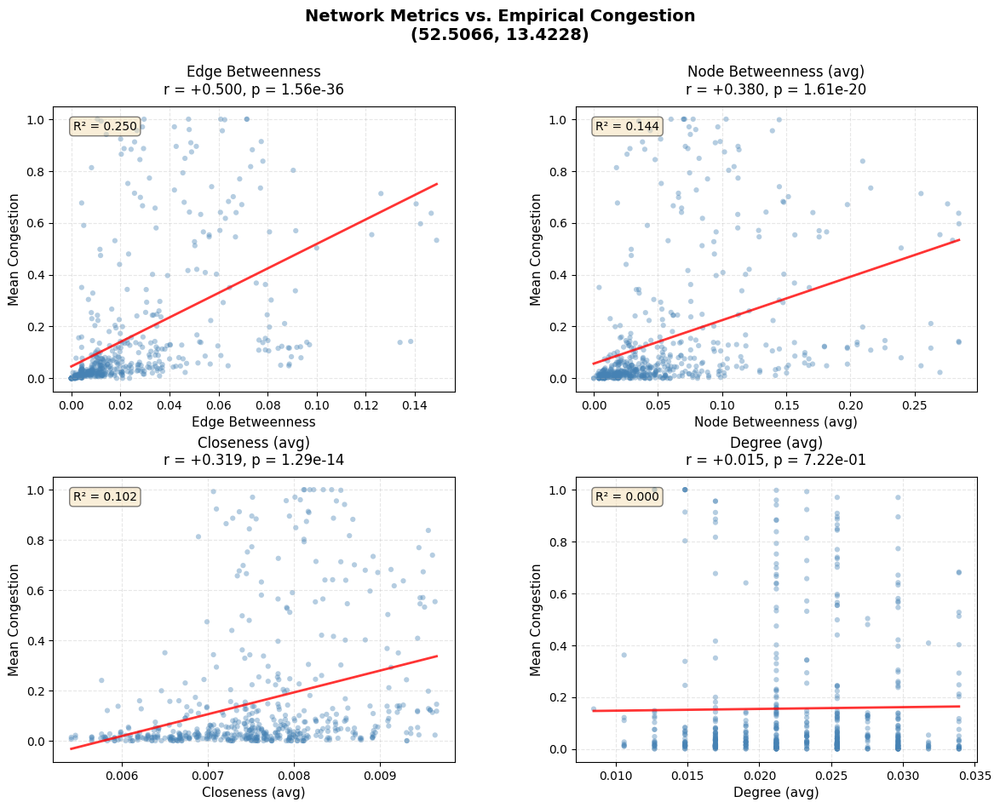

In [ ]:
# TASK 4c: VALIDATE AT SECOND LOCATION (OBELISCO)

print("\n" + "="*70)
print("TASK 4c: VALIDATION AT SECOND LOCATION - OBELISCO")
print("="*70)

loader_obelisco = NetworkLoader.from_address('Adalbertstraße 58, Berlin, Germany', dist=1000)
loader_obelisco.load()

# Create analyze
analyzer_obelisco = TrafficAnalysis(loader_obelisco)

# Run same analysis
analyzer_obelisco.run_empirical_analysis(num_runs=1, num_steps=2000, num_cars=1200)
analyzer_obelisco.compute_network_metrics()

# Check if edge betweenness still predicts well
#validation_obelisco = analyzer_obelisco.validate_prediction_accuracy(
#     metric_name='edge_betweenness',
#     n=10,
#     verbose=True
# )

# Compare correlations between locations
print("\n" + "="*70)
print("COMPARISON: Buenos Aires vs Obelisco")
print("="*70)
print("\nCorrelations at Obelisco:")
correlations_obelisco = analyzer_obelisco.correlate_metrics_with_congestion()

# Visualize Obelisco correlations
fig_ob, axes_ob = analyzer_obelisco.plot_correlation_analysis()
plt.show()